In [117]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import cm
import seaborn as sns
from scipy import stats

In [118]:
def clean_data(data):
    data = data.replace([np.inf, -np.inf], np.nan)
    data['Timestamp'] = pd.to_datetime(data['Timestamp'], errors='coerce')

    numeric_columns = data.select_dtypes(include=[np.number]).columns
    data[numeric_columns] = data[numeric_columns].apply(lambda x: x.fillna(x.mean()))

    data.drop_duplicates(inplace=True)

    null_columns = data.columns[data.isnull().sum() == len(data)]
    data.drop(columns=null_columns, inplace=True)

    return data


In [119]:
def summery(data):
    return data.describe(include='all')

In [120]:
def data_quality_check(data):
    print(data.isnull().sum())
    negative_values = data[(data['GHI'] < 0) | (data['DNI'] < 0) | (data['DHI'] < 0)]
    print(negative_values)
    

In [121]:
def correlation(data):
    # Heatmap for correlations
    plt.figure(figsize=(10, 8))
    sns.heatmap(data.corr(), annot=True, cmap='coolwarm')
    plt.title('Correlation Heatmap')
    plt.show()
    # Pair plot
    sns.pairplot(data[['GHI', 'DNI', 'DHI', 'TModA', 'TModB', 'WS', 'WSgust', 'WD']])
    plt.show()

In [122]:
def wind_analysis(data, location_name):
    wind_variables = ['WS', 'WSgust', 'WSstdev', 'WD', 'WDstdev']
    plt.figure(figsize=(12, 6))
    sns.lineplot(data=data[wind_variables])
    plt.title(f"Wind Speed and Direction for {location_name}")
    plt.xlabel("Time")
    plt.ylabel("Value")
    plt.show()

In [123]:
def temperature_analysis(data, location_name):
    temperature_variables = ['TModA', 'TModB']
    plt.figure(figsize=(12, 6))
    sns.lineplot(data=data[temperature_variables])
    plt.title(f"Temperature for {location_name}")
    plt.xlabel("Time")
    plt.ylabel("Value")
    plt.show()

In [124]:
def histogram(data, location_name):
    histogram_variables = ['GHI', 'DNI', 'DHI', 'WS', 'Tamb']
    for var in histogram_variables:
        plt.figure(figsize=(12, 6))
        sns.histplot(data[var], kde=True)
        plt.title(f"Histogram of {var} for {location_name}")
        plt.xlabel(var)
        plt.ylabel("Count")
        plt.show()

In [125]:
def z_score(data):
    data['z_GHI'] = stats.zscore(data['GHI'])
    data['z_DNI'] = stats.zscore(data['DNI'])
    data['z_outliers'] = data[(abs(data['z_GHI']) > 3)]

In [126]:
def bubble_chart(data):
    plt.figure(figsize=(10, 8))
    plt.scatter(data['GHI'], data['Tamb'], s=data['RH'], alpha=0.5)
    plt.title('GHI vs Tamb with RH as Bubble Size')
    plt.xlabel('GHI')
    plt.ylabel('Tamb')
    plt.show()

In [127]:
def eda(data, location_name):
    data = clean_data(data)
    
    print(summery(data))

    # check data quality
    data_quality_check(data)


    # plot the data
    plt.figure(figsize=(14, 7))
    data[['GHI', 'DNI', 'DHI', 'Tamb']].plot()
    plt.title('Time Series Analysis')
    plt.xlabel('Time')
    plt.ylabel('Values')
    plt.show()

    # correlation
    correlation(data)

    # wind analysis
    wind_analysis(data, location_name)

    # temperature analysis
    temperature_analysis(data, location_name)

    # histogram
    histogram(data, location_name)

    # bubble chart
    bubble_chart(data)
    # data clean
    data = clean_data(data)

                           Timestamp            GHI            DNI  \
count                         525600  525600.000000  525600.000000   
mean   2022-02-07 12:00:30.000000512     240.559452     167.187516   
min              2021-08-09 00:01:00     -12.900000      -7.800000   
25%              2021-11-08 06:00:45      -2.000000      -0.500000   
50%              2022-02-07 12:00:30       1.800000      -0.100000   
75%              2022-05-09 18:00:15     483.400000     314.200000   
max              2022-08-09 00:00:00    1413.000000     952.300000   
std                              NaN     331.131327     261.710501   

                 DHI           ModA           ModB           Tamb  \
count  525600.000000  525600.000000  525600.000000  525600.000000   
mean      115.358961     236.589496     228.883576      28.179683   
min       -12.600000       0.000000       0.000000      11.000000   
25%        -2.100000       0.000000       0.000000      24.200000   
50%         1.600000    

<Figure size 1400x700 with 0 Axes>

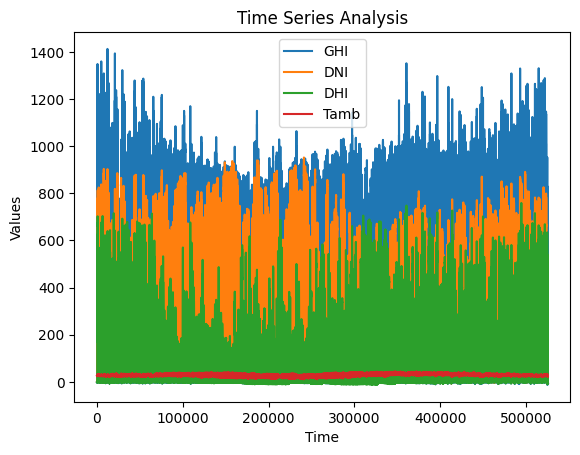

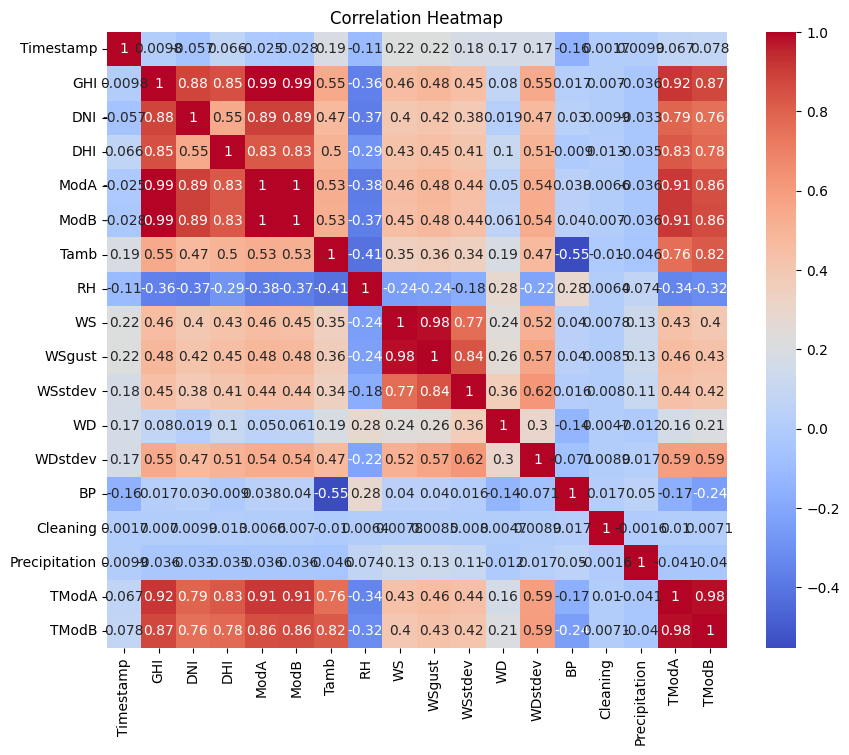

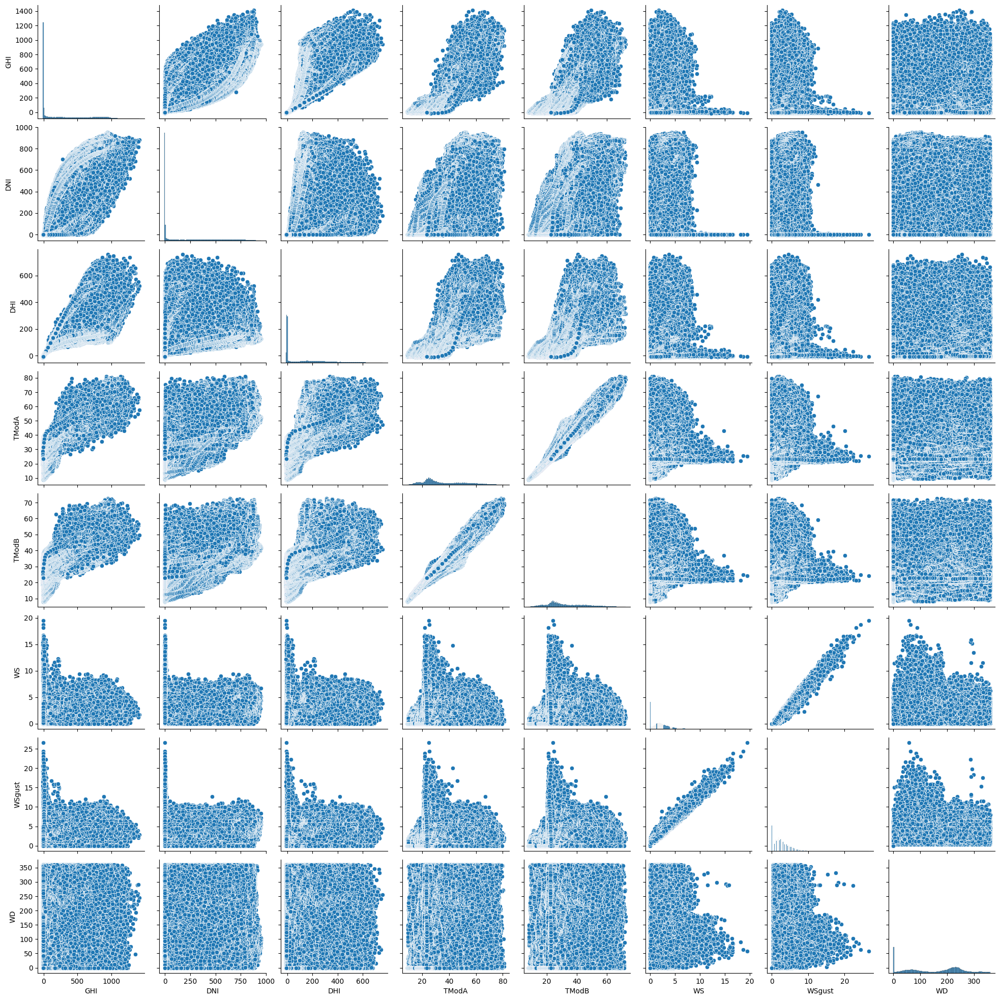

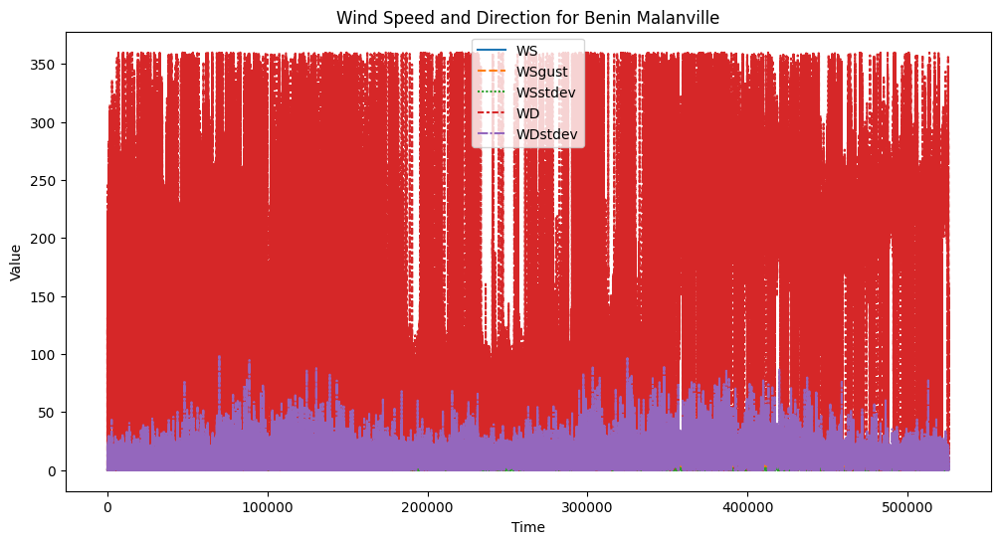

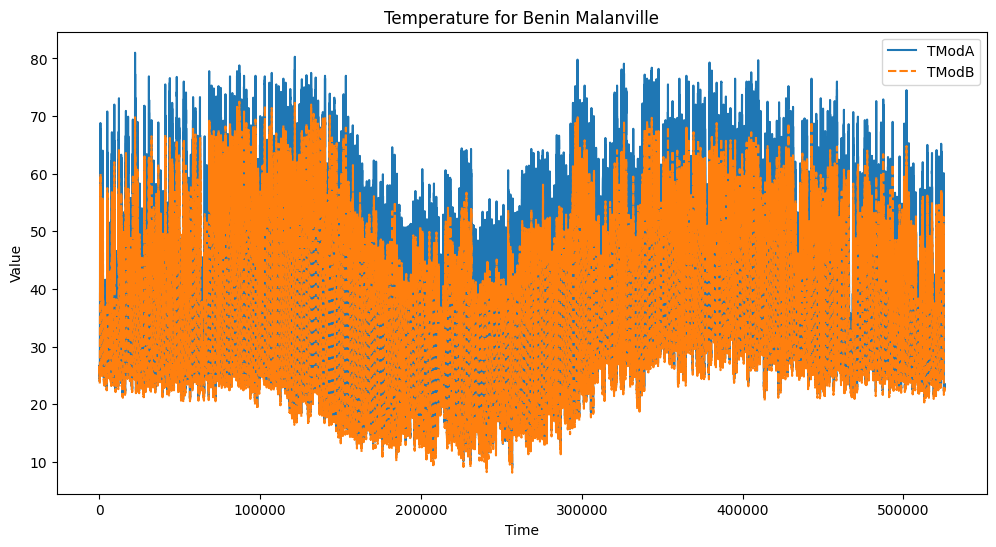

...

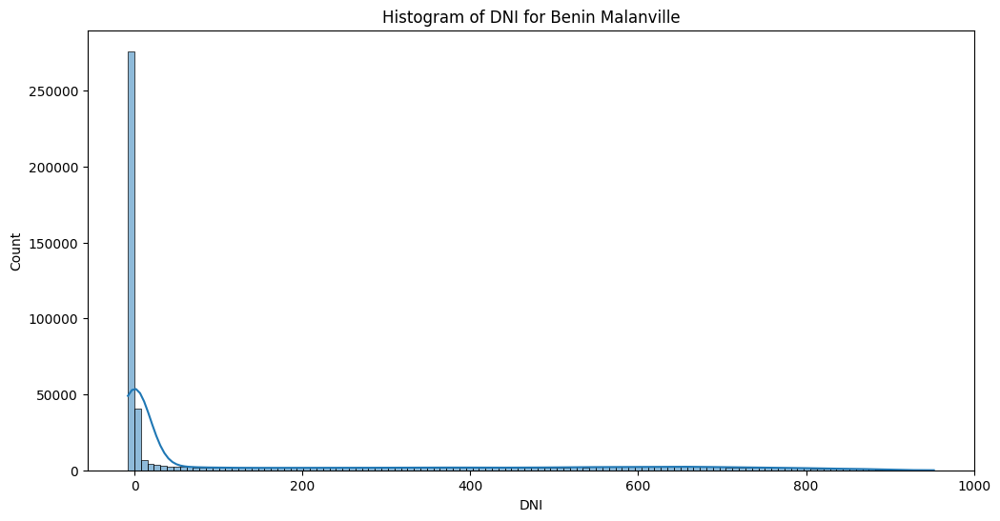

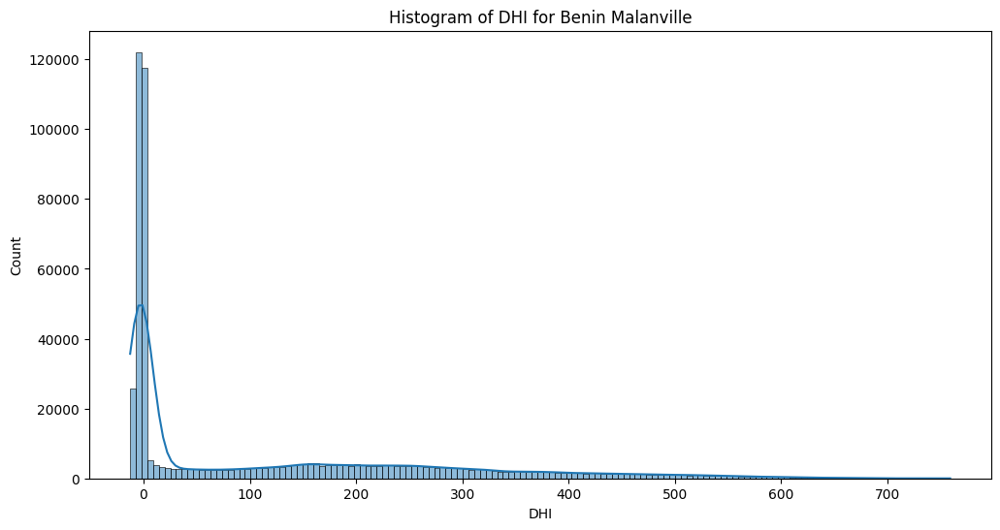

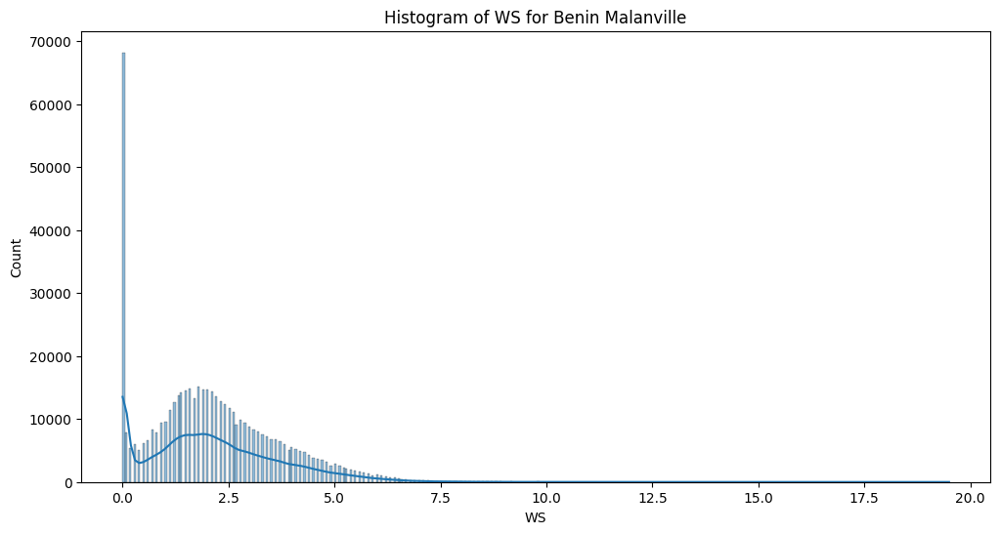

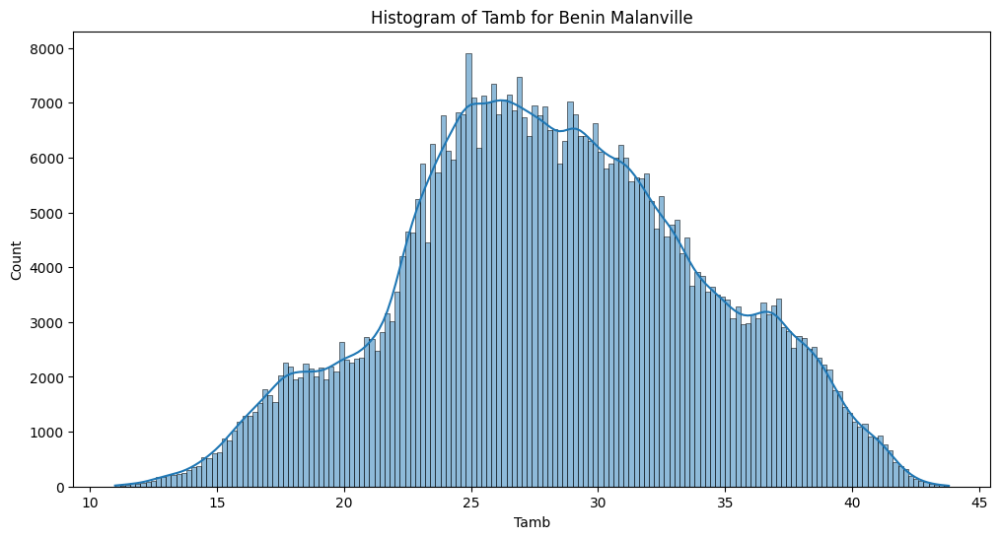

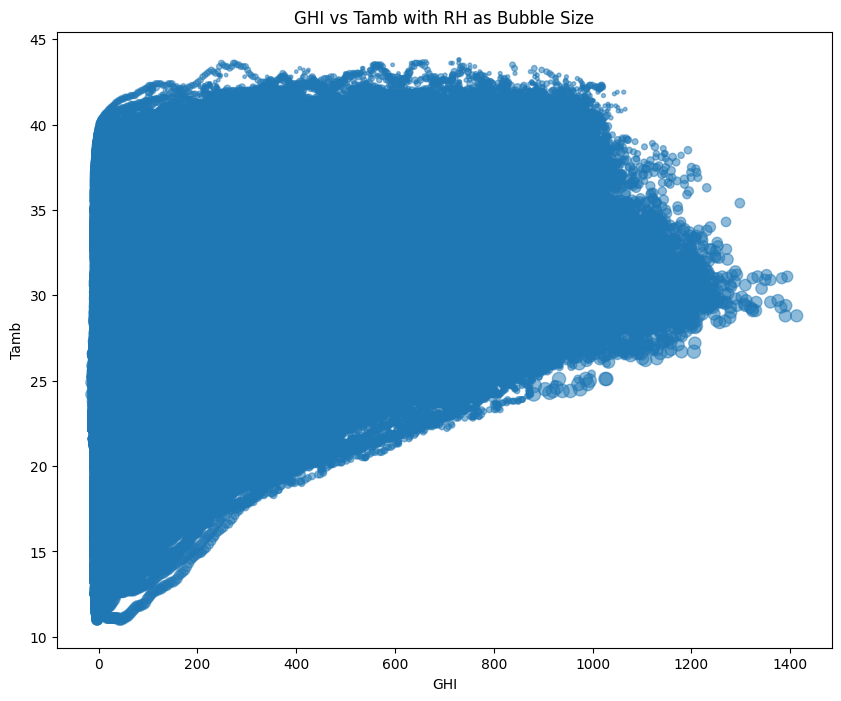

                           Timestamp            GHI            DNI  \
count                         525600  525600.000000  525600.000000   
mean   2022-04-30 12:00:30.000000768     201.957515     116.376337   
min              2021-10-30 00:01:00     -19.500000      -7.800000   
25%              2022-01-29 06:00:45      -2.800000      -0.300000   
50%              2022-04-30 12:00:30       0.300000      -0.100000   
75%              2022-07-30 18:00:15     362.400000     107.000000   
max              2022-10-30 00:00:00    1499.000000     946.000000   
std                              NaN     298.495150     218.652659   

                 DHI           ModA           ModB           Tamb  \
count  525600.000000  525600.000000  525600.000000  525600.000000   
mean      113.720571     206.643095     198.114691      26.319394   
min       -17.900000       0.000000       0.000000      12.300000   
25%        -3.800000       0.000000       0.000000      23.100000   
50%        -0.100000    

<Figure size 1400x700 with 0 Axes>

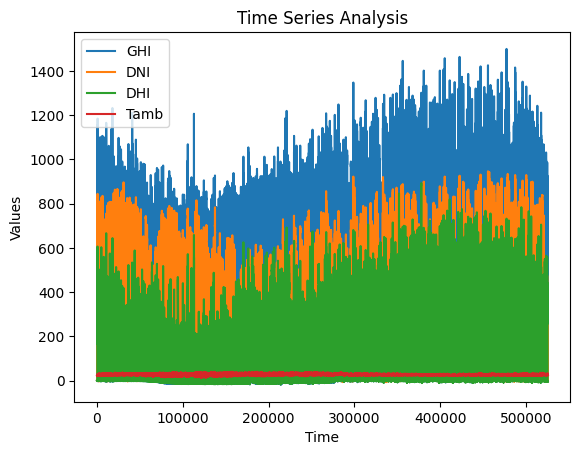

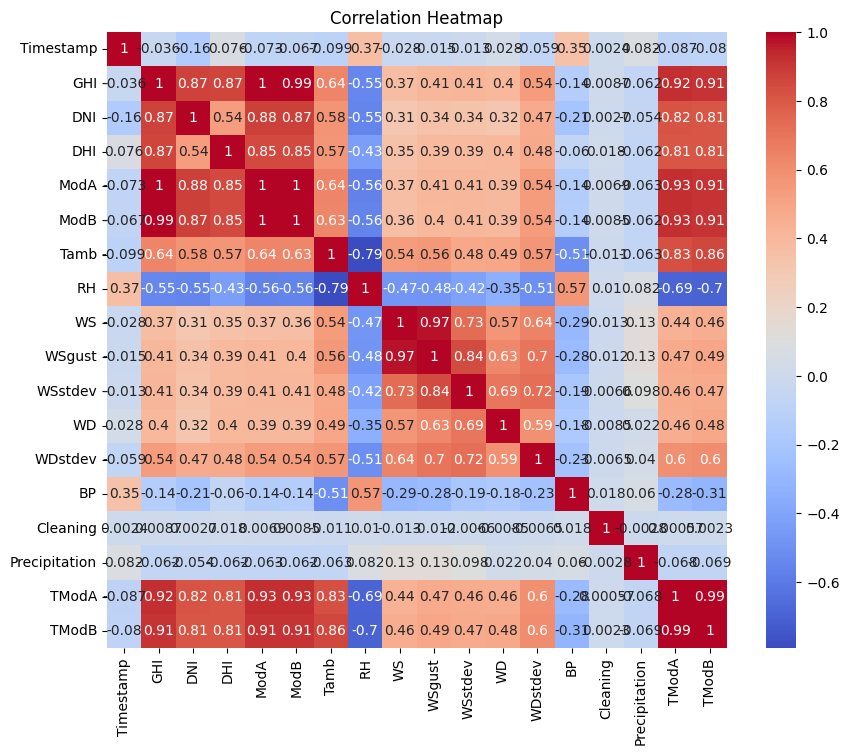

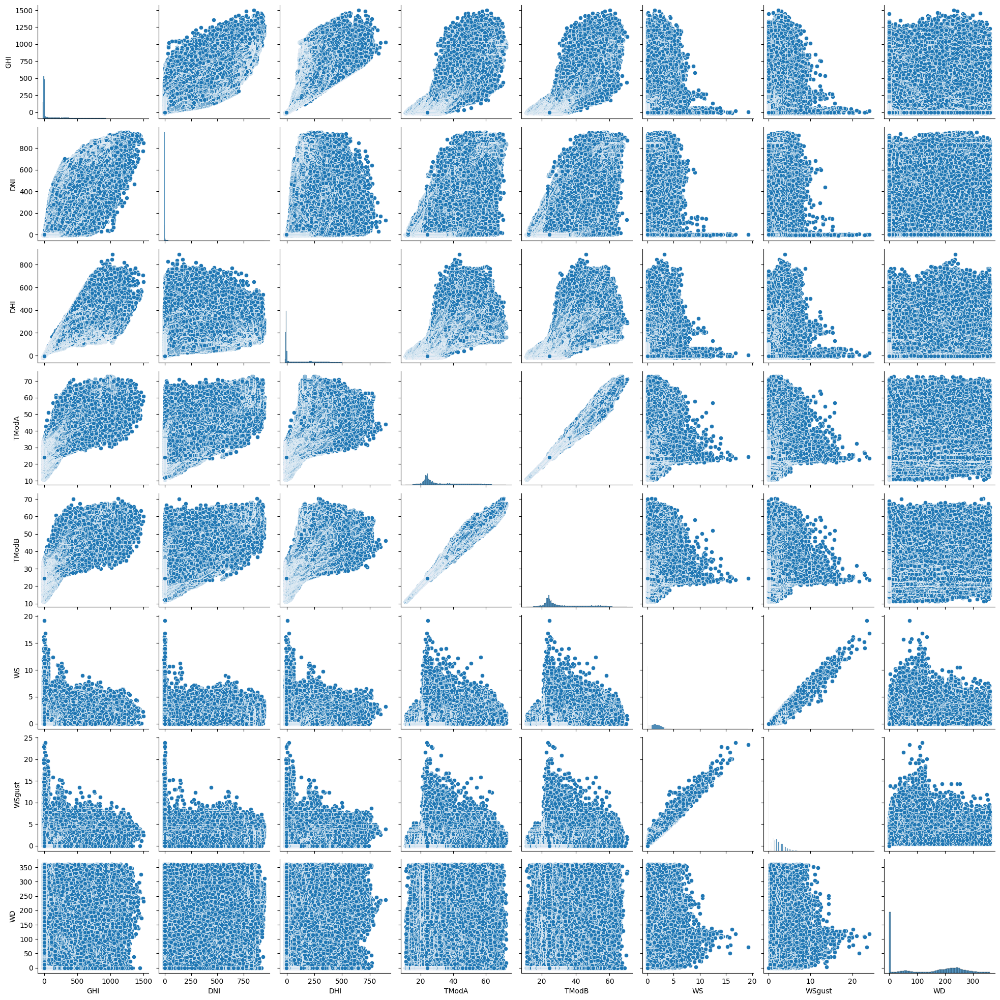

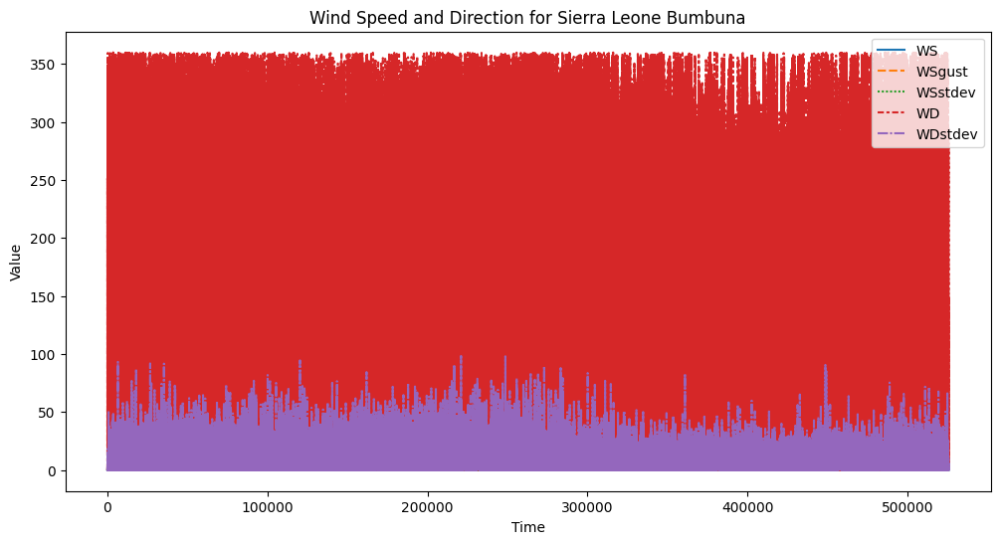

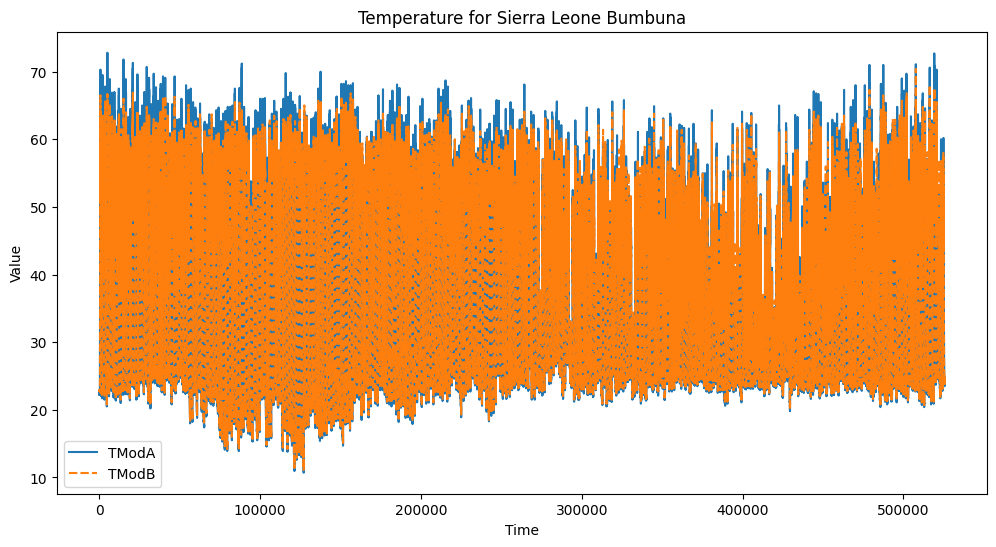

...

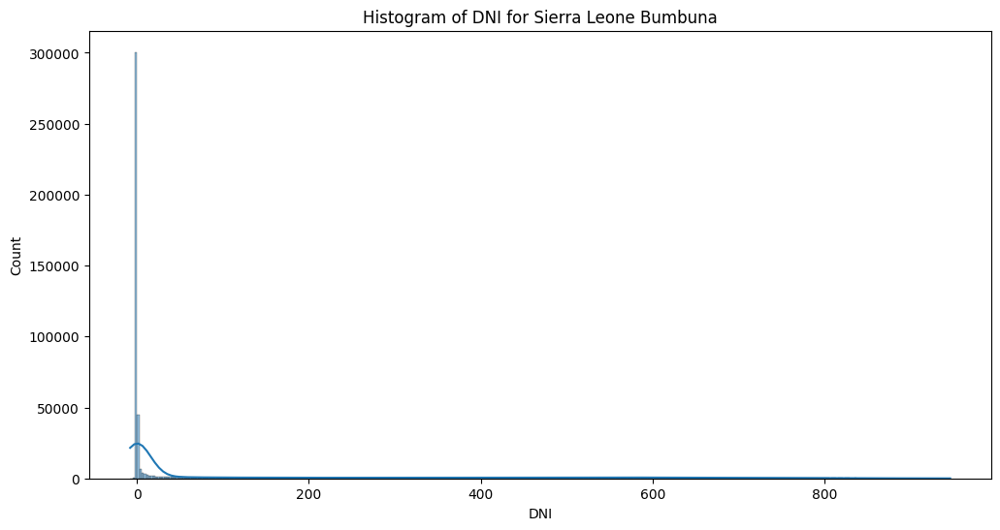

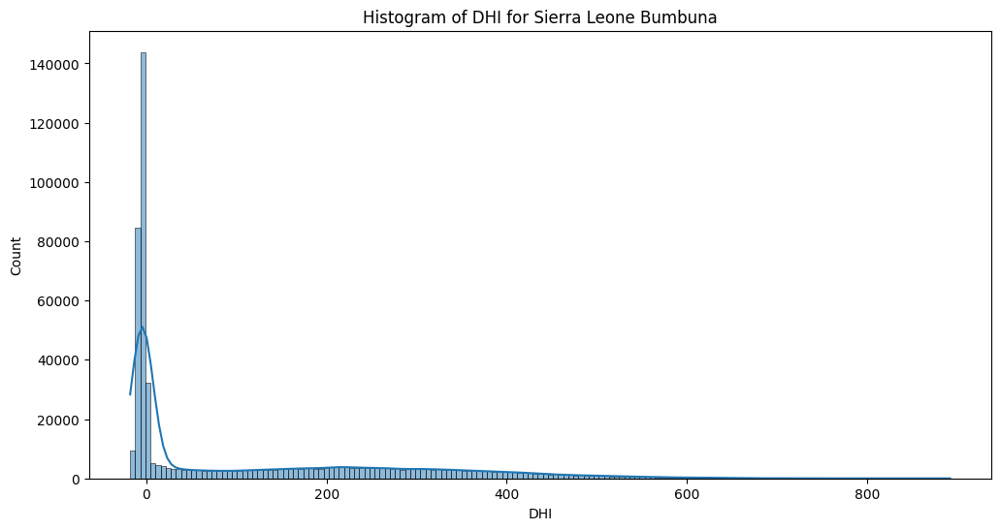

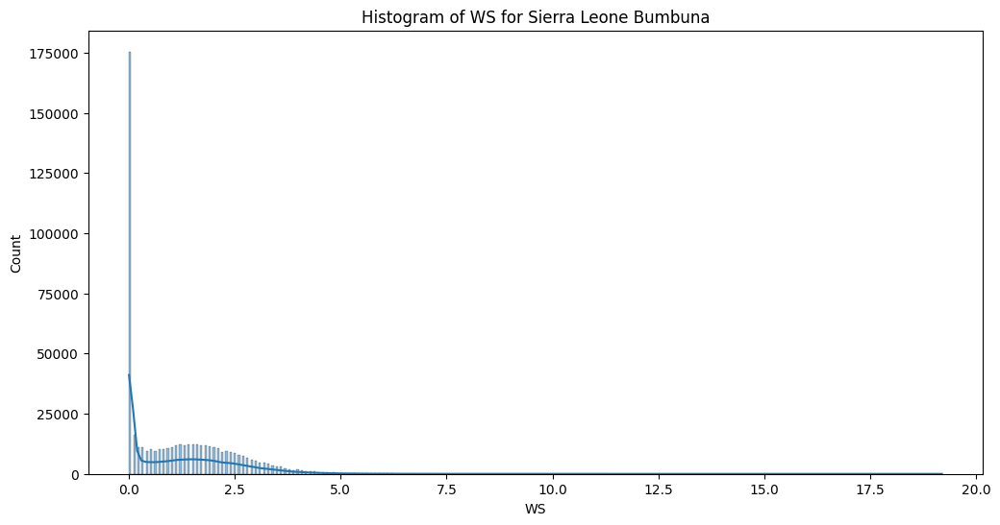

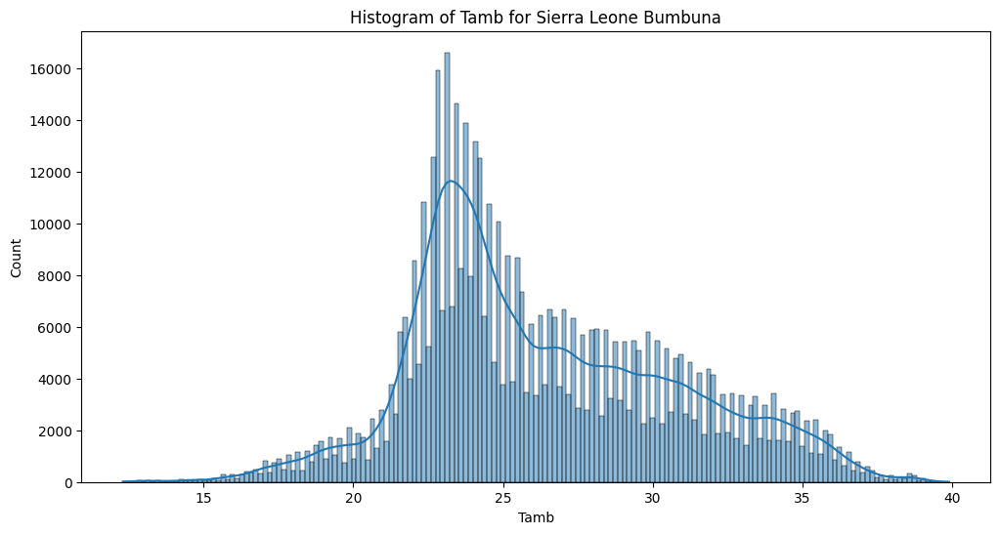

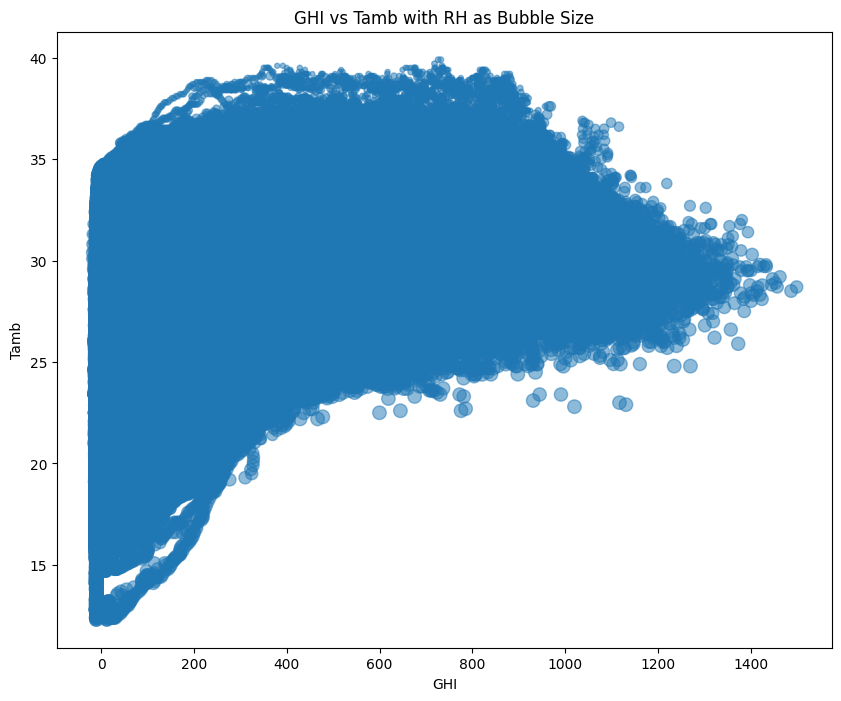

                           Timestamp            GHI            DNI  \
count                         525600  525600.000000  525600.000000   
mean   2022-04-25 12:00:30.000000768     230.555040     151.258469   
min              2021-10-25 00:01:00     -12.700000       0.000000   
25%              2022-01-24 06:00:45      -2.200000       0.000000   
50%              2022-04-25 12:00:30       2.100000       0.000000   
75%              2022-07-25 18:00:15     442.400000     246.400000   
max              2022-10-25 00:00:00    1424.000000    1004.500000   
std                              NaN     322.532347     250.956962   

                 DHI           ModA           ModB           Tamb  \
count  525600.000000  525600.000000  525600.000000  525600.000000   
mean      116.444352     226.144375     219.568588      27.751788   
min         0.000000       0.000000       0.000000      14.900000   
25%         0.000000       0.000000       0.000000      24.200000   
50%         2.500000    

<Figure size 1400x700 with 0 Axes>

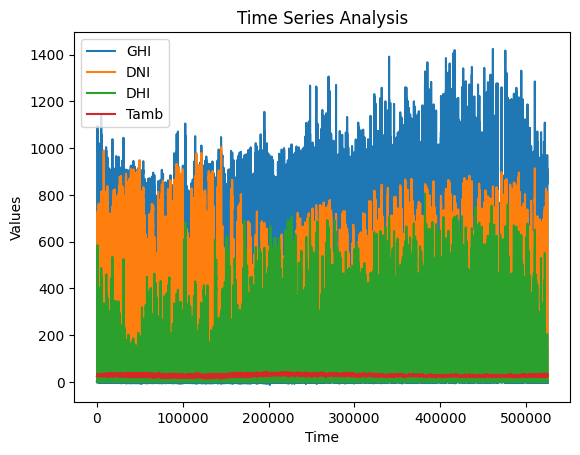

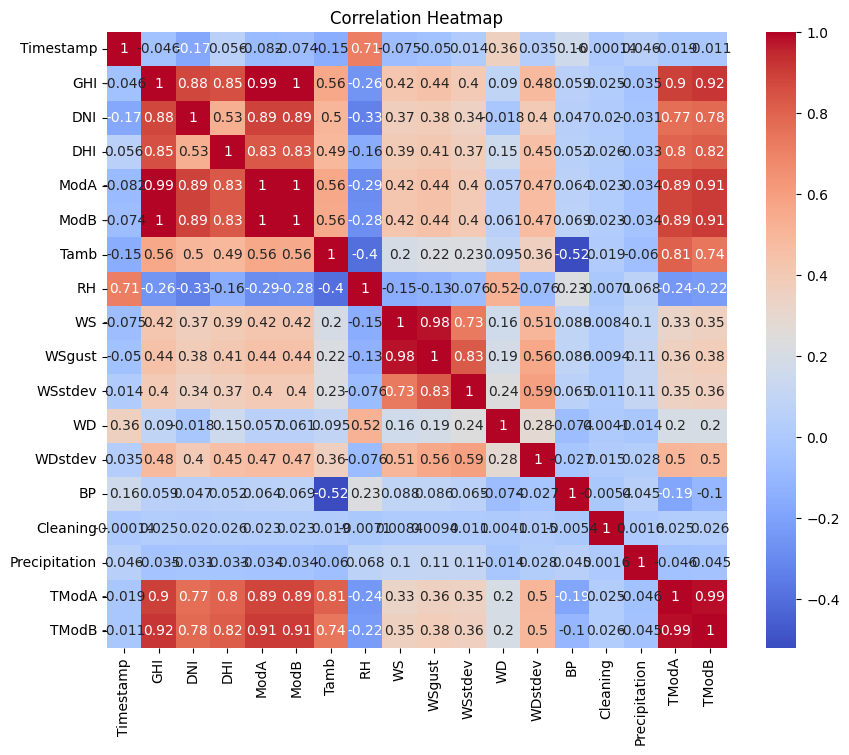

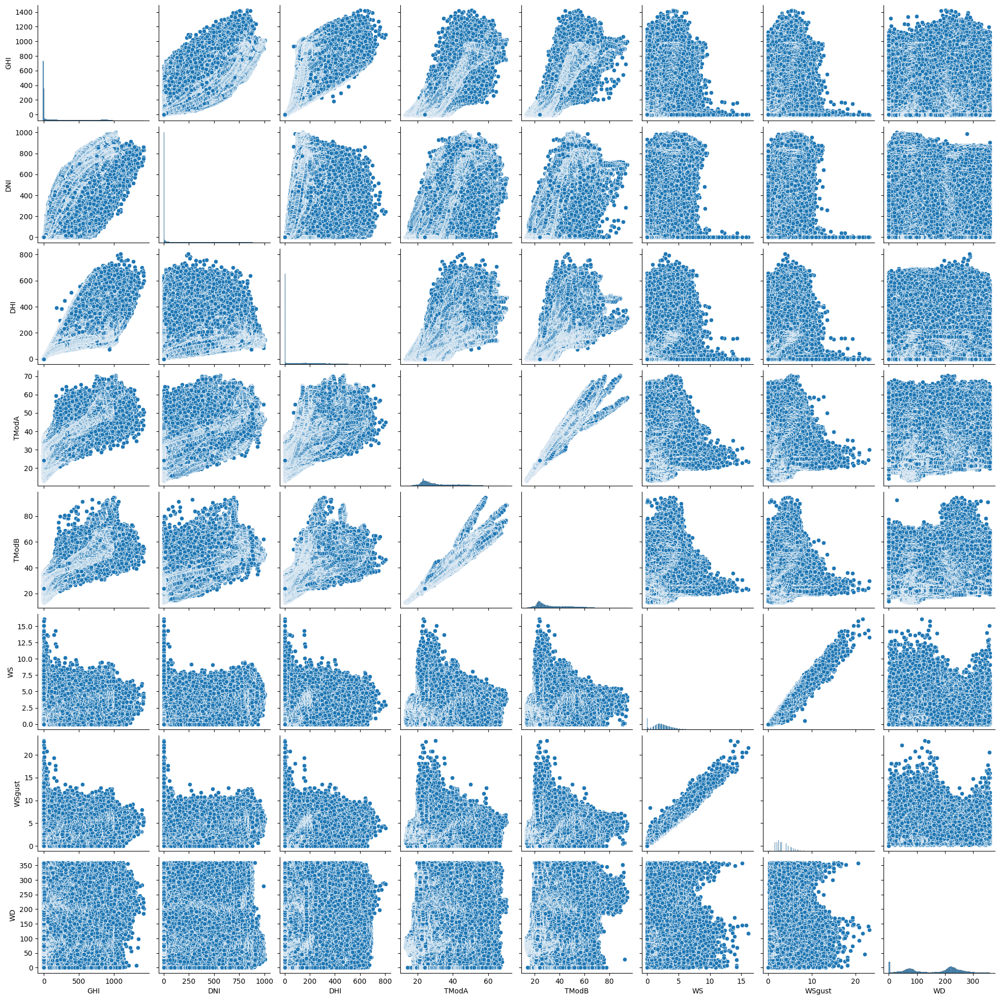

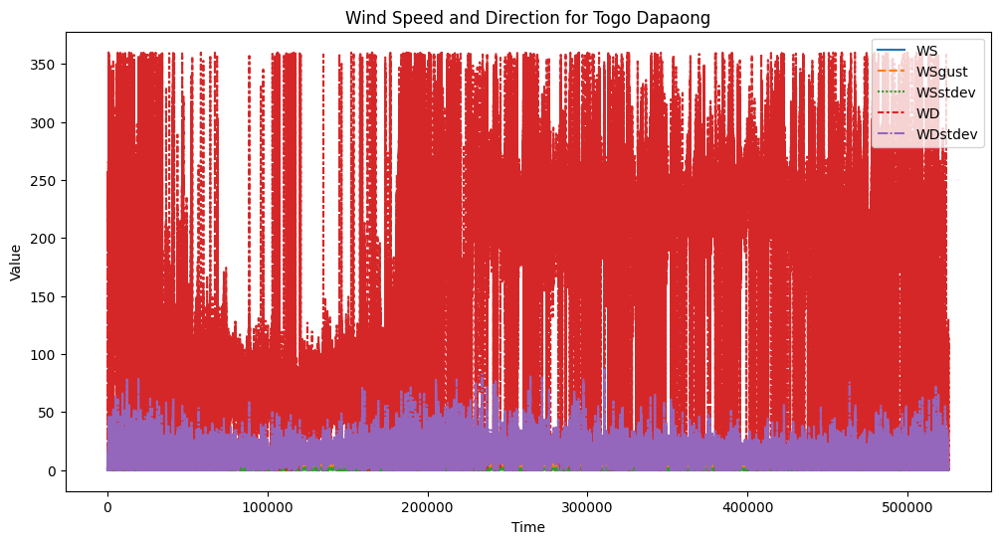

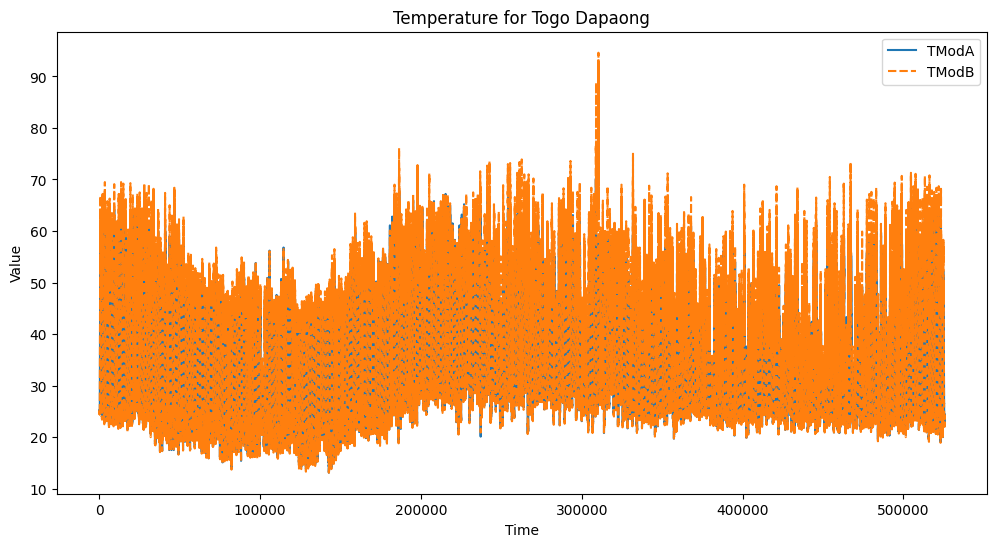

...

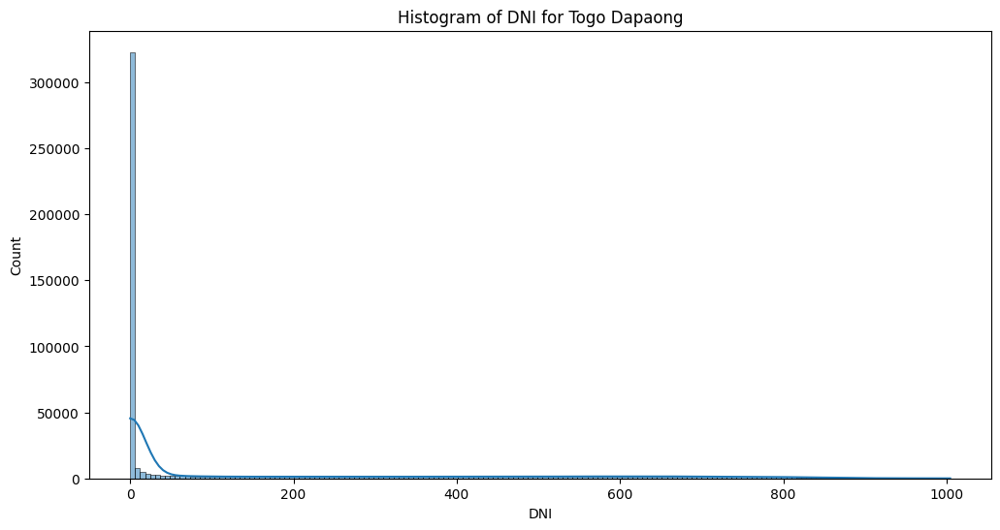

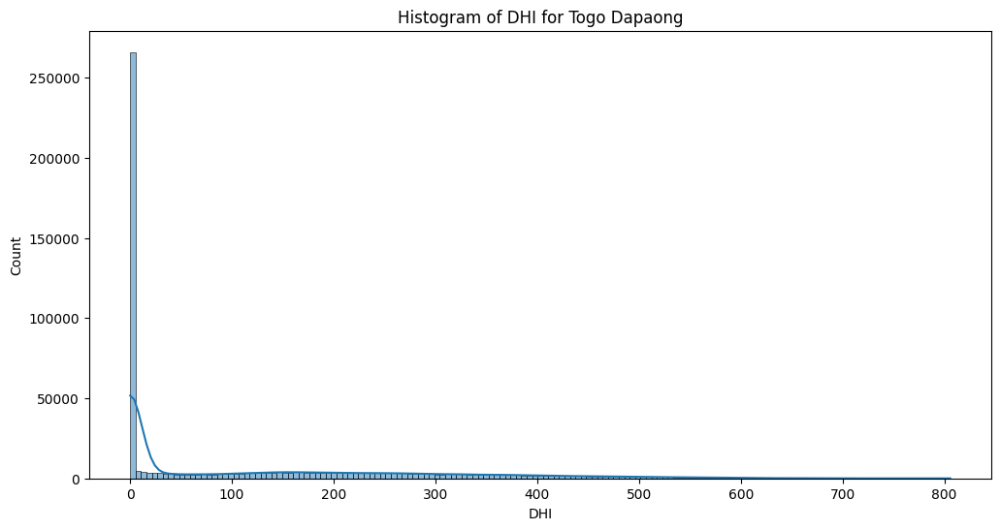

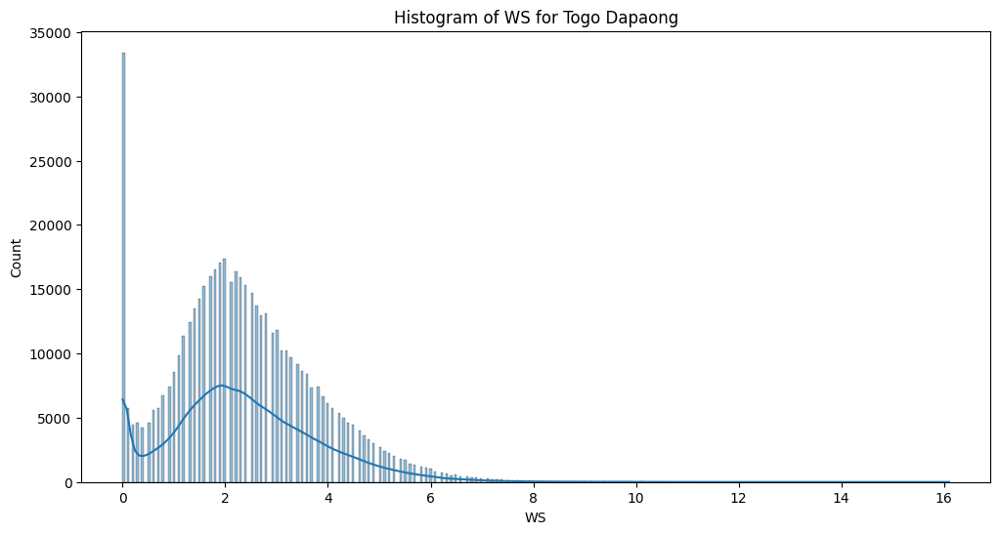

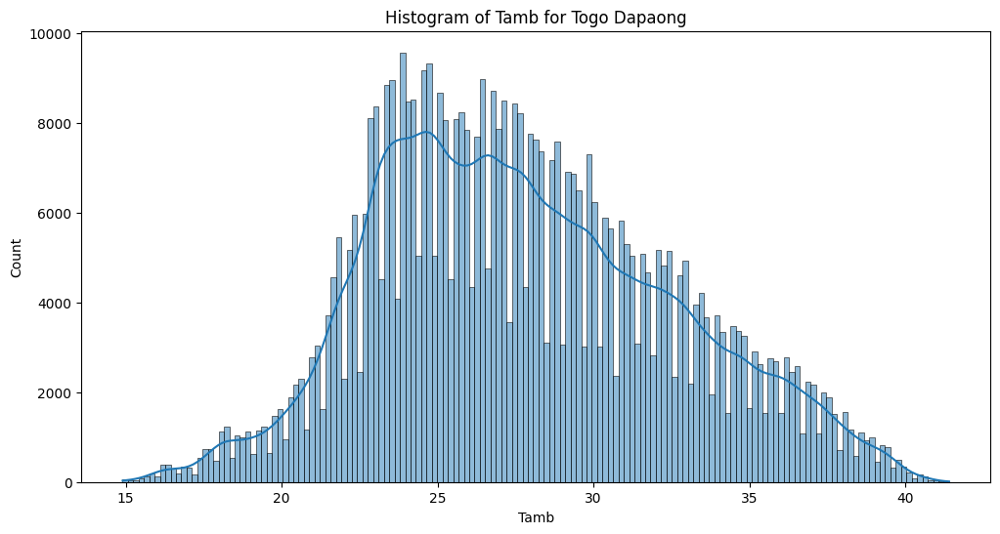

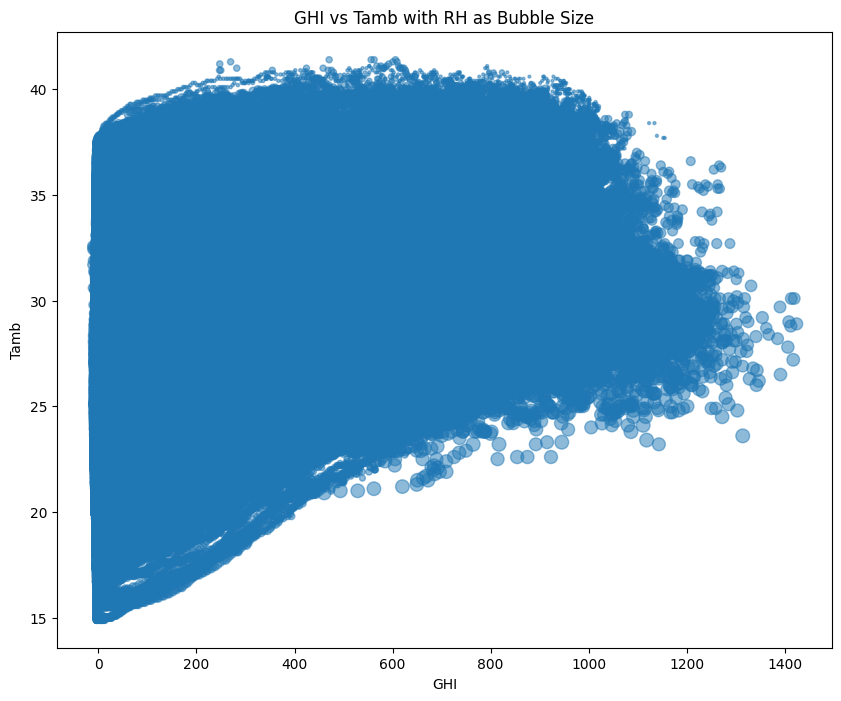

In [128]:
data = pd.read_csv('../../data/benin-malanville.csv')
data = clean_data(data)
# print(summery(data))
eda(data, 'Benin Malanville')

data = pd.read_csv('../../data/sierraleone-bumbuna.csv')

data = clean_data(data)
eda(data, 'Sierra Leone Bumbuna')

data = pd.read_csv('../../data/togo-dapaong_qc.csv')

data = clean_data(data)
eda(data, 'Togo Dapaong')
